# Potential Functions for CNT - Implementation

## Case 1

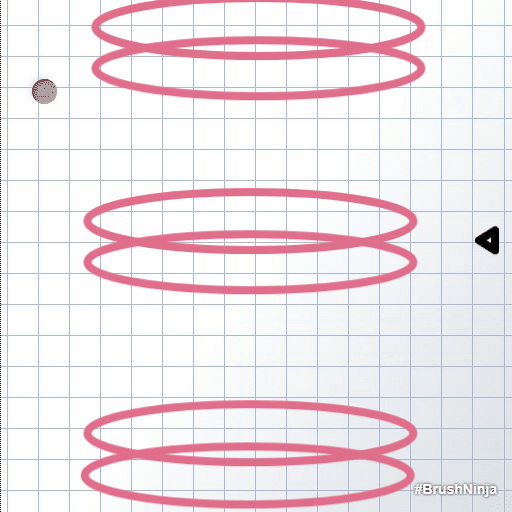

In [102]:
import numpy as np
# Number of Iteration (Rings = 2 + 4*Iterations)
n_iter = 10

# Lennard-Jones potential (C-H)
sigma = 2.4799 # Angstrom
epsilon = 0.00193 # eV
def lj(r): return (4*epsilon*(((sigma/r)**12) - ((sigma/r)**6)))

# Base ring
z0 = 0.71/2

# Two types of rings
xa = [1.957218, -1.583422,  0.604813, -1.583422,  0.604813]
ya = [0.000000,  1.150424, -1.861425, -1.150424,  1.861425]
xb = [1.583422, -0.604813,  1.583422, -1.957218, -0.604813]
yb = [-1.150424, -1.861425,  1.150424,  0.000000,  1.861425]

# Potential function for CNT (rho is along the y-axis of the CNT)
def V1(rho):
    iter = 1
    net_potential = 0
    # First 2 rings
    for i in range(len(xa)):
        x = 0
        y = rho
        z = 0 
        Ra = ((x-xa[i])**2 + (y-ya[i])**2 + (z-z0)**2)**0.5
        Rb = ((x-xb[i])**2 + (y-yb[i])**2 + (z-z0)**2)**0.5
        net_potential += lj(Ra) + lj(Rb) 
    # Further Iterations
    while iter < n_iter:
        # 4 rings are chosen every iteration and their potentials are added
        x = 0
        y = rho
        z = 0 
        # Decide the z values for the two ring sets
        z1 = z0 + 2.13*iter
        z2 = z0 - 0.71 + 2.13*iter
        # Calculate the potentials
        for i in range(len(xa)):
            Ra1 = ((x-xa[i])**2 + (y-ya[i])**2 + (z-z1)**2)**0.5
            Rb1 = ((x-xb[i])**2 + (y-yb[i])**2 + (z-z1)**2)**0.5
            Ra2 = ((x-xa[i])**2 + (y-ya[i])**2 + (z-z2)**2)**0.5
            Rb2 = ((x-xb[i])**2 + (y-yb[i])**2 + (z-z2)**2)**0.5
            net_potential += lj(Ra1) + lj(Rb1) + lj(Ra2) + lj(Rb2)
            iter += 1
    return net_potential

### Plotting net potential

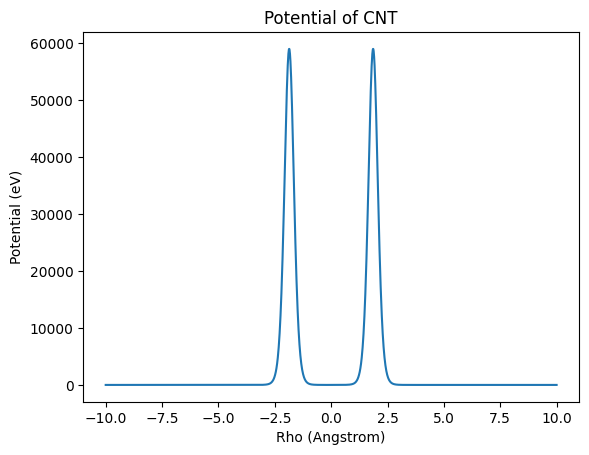

In [103]:
import matplotlib.pyplot as plt
# Generate the y array
y_arr = np.linspace(-10,10,2000)
v_arr = np.array([V1(y) for y in y_arr])
plt.plot(y_arr, v_arr)
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT')
plt.show()

In [104]:
print(y_arr[np.argmax(v_arr)], v_arr[np.argmax(v_arr)])

1.865932966483241 58976.41759178118


### Exporting data

In [105]:
import pandas as pd

# Exporting the data
df = pd.DataFrame({'Rho': y_arr, 'Potential': v_arr})
df.to_csv('cnt_potential_case_1.csv', index=False)

### Fitting data to gaussian

58033.73948488791 58033.73948513895 0.046565581194098475


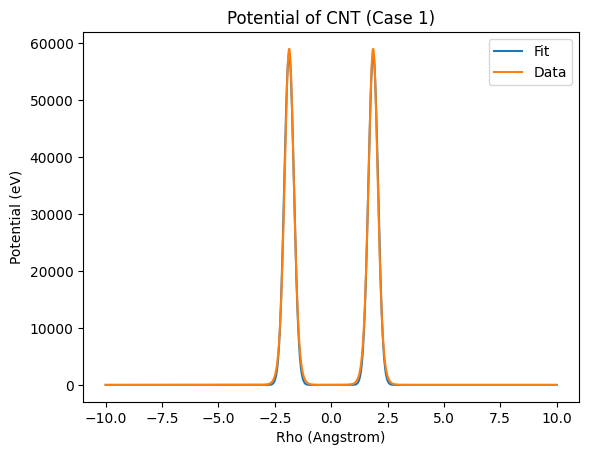

In [106]:
from scipy.optimize import curve_fit
def gauss(x, a, b, c):
    peak = 1.865932966483241
    return ((a*np.exp(-0.5*(((x-peak)**2)/c)))+(b*np.exp(-0.5*(((x+peak)**2)/c))))

def fit_gauss():
    # Fit a double Gaussian to the data
    popt, pcov = curve_fit(gauss, y_arr, v_arr)
    return popt

a,b,c = fit_gauss()
print(a,b,c)
v_fit = [gauss(y, a, b, c) for y in y_arr]
plt.plot(y_arr, v_fit, label='Fit')
plt.plot(y_arr, v_arr, label='Data')
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT (Case 1)')
plt.legend()
plt.show()

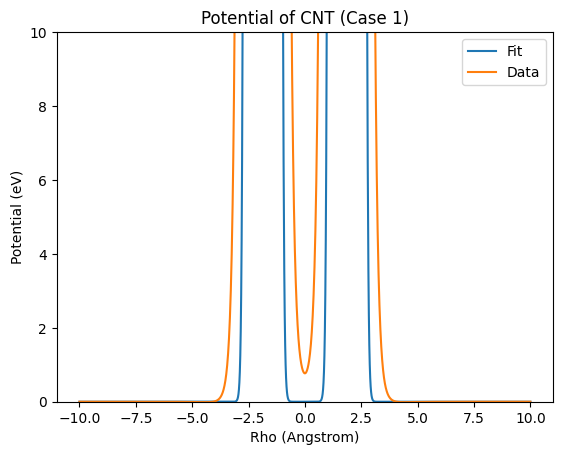

In [107]:
plt.plot(y_arr, v_fit, label='Fit')
plt.plot(y_arr, v_arr, label='Data')
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT (Case 1)')
plt.legend()
plt.ylim(0,10)
plt.show()

### Final Fitted Function

In [108]:
import numpy as np
def v1(rho): 
    peak = 1.865932966483241
    a = 58033.73948488791
    b = 58033.73948513895
    c = 0.046565581194098475
    return ((a*np.exp(-0.5*(((rho-peak)**2)/c)))+(b*np.exp(-0.5*(((rho+peak)**2)/c))))

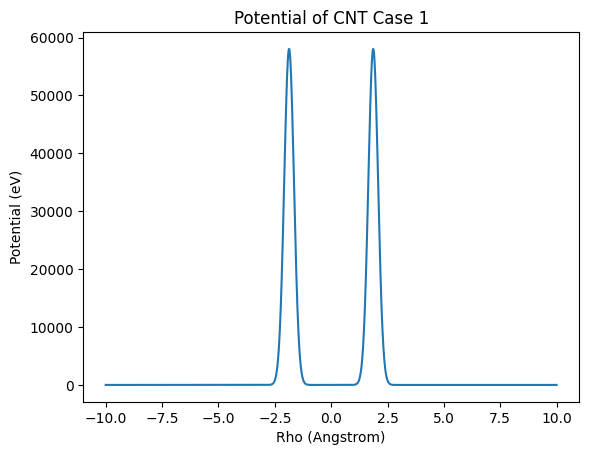

In [109]:
import matplotlib.pyplot as plt
# Generate the y array
y_arr = np.linspace(-10,10,2000)
v_arr = np.array([v1(y) for y in y_arr])
plt.plot(y_arr, v_arr)
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT Case 1')
plt.show()

## Case 2

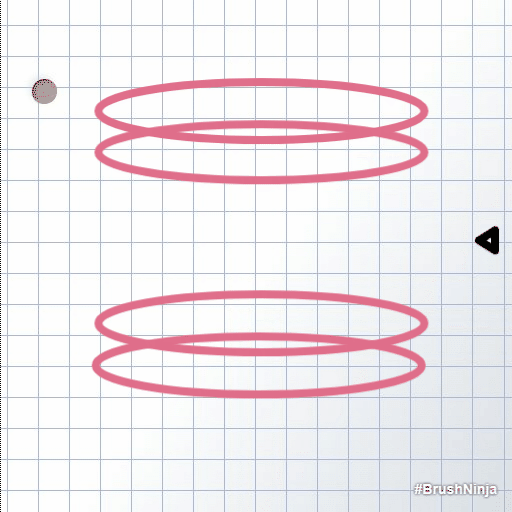

In [110]:
import numpy as np
# Number of Iteration (Rings = 4*Iterations)
n_iter = 20

# Lennard-Jones potential (C-H)
sigma = 2.4799 # Angstrom
epsilon = 0.00193 # eV
def lj(r): return (4*epsilon*(((sigma/r)**12) - ((sigma/r)**6)))

# Base ring
z0 = 0.71

# Two types of rings
xa = [1.957218, -1.583422,  0.604813, -1.583422,  0.604813]
ya = [0.000000,  1.150424, -1.861425, -1.150424,  1.861425]
xb = [1.583422, -0.604813,  1.583422, -1.957218, -0.604813]
yb = [-1.150424, -1.861425,  1.150424,  0.000000,  1.861425]

# Potential function for CNT (rho is along the y-axis of the CNT)
def V2(rho):
    iter = 0
    net_potential = 0
    while iter < n_iter:
        # 4 rings are chosen every iteration and their potentials are added
        x = 0
        y = rho
        z = 0 
        # Decide the z values for the two rings
        if iter%2==0:
            za = z0 + 2.13*iter
            zb = z0 + 0.71 + 2.13*iter
        elif iter%2==1: 
            zb = z0 + 2.13*iter
            za = z0 + 0.71 + 2.13*iter
        # Calculate the potentials
        for i in range(len(xa)):
            Ra = ((x-xa[i])**2 + (y-ya[i])**2 + (z-za)**2)**0.5
            Rb = ((x-xb[i])**2 + (y-yb[i])**2 + (z-zb)**2)**0.5
            net_potential += 2*(lj(Ra) + lj(Rb))
            iter += 1
    return net_potential

### Plotting net potential

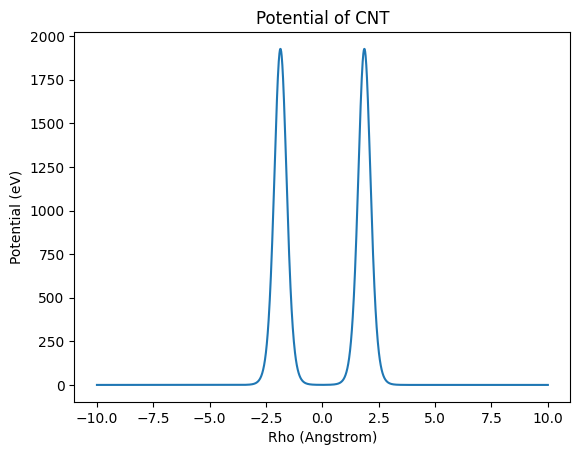

In [111]:
import matplotlib.pyplot as plt
# Generate the y array
y_arr = np.linspace(-10,10,2000)
v_arr = np.array([V2(y) for y in y_arr])
plt.plot(y_arr, v_arr)
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT')
plt.show()

In [112]:
print(y_arr[np.argmax(v_arr)], v_arr[np.argmax(v_arr)])


1.865932966483241 1926.670030686717


### Exporting data

In [113]:
import pandas as pd

# Exporting the data
df = pd.DataFrame({'Rho': y_arr, 'Potential': v_arr})
df.to_csv('cnt_potential_case_2.csv', index=False)

### Fitting data to gaussian

1895.6492744427846 1895.6492744542506 0.08244356377086766


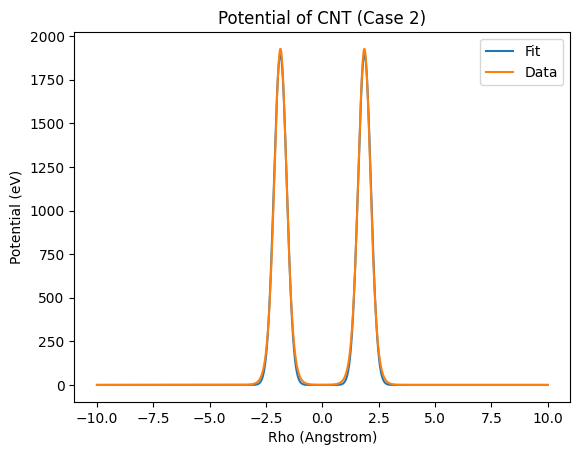

In [114]:
from scipy.optimize import curve_fit
def gauss(x, a, b, c):
    peak = 1.865932966483241
    return ((a*np.exp(-0.5*(((x-peak)**2)/c)))+(b*np.exp(-0.5*(((x+peak)**2)/c))))

def fit_gauss():
    # Fit a double Gaussian to the data
    popt, pcov = curve_fit(gauss, y_arr, v_arr)
    return popt

a,b,c = fit_gauss()
print(a,b,c)
v_fit = [gauss(y, a, b, c) for y in y_arr]
plt.plot(y_arr, v_fit, label='Fit')
plt.plot(y_arr, v_arr, label='Data')
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT (Case 2)')
plt.legend()
plt.show()

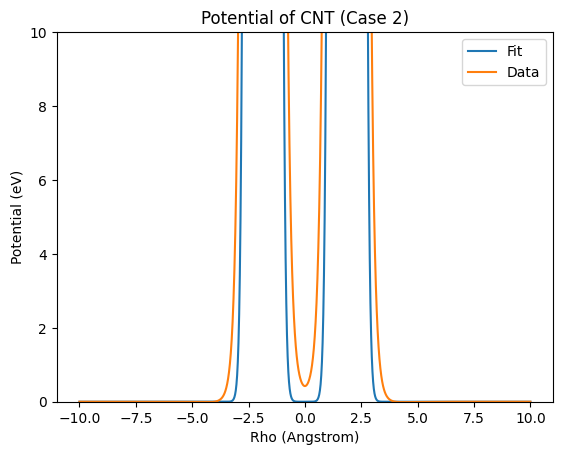

In [115]:
plt.plot(y_arr, v_fit, label='Fit')
plt.plot(y_arr, v_arr, label='Data')
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT (Case 2)')
plt.legend()
plt.ylim(0,10)
plt.show()

### Final Fitted Function

In [116]:
import numpy as np
def v2(rho): 
    peak = 1.865932966483241
    a = 1895.6492744427846
    b = 1895.6492744542506
    c = 0.08244356377086766
    return ((a*np.exp(-0.5*(((rho-peak)**2)/c)))+(b*np.exp(-0.5*(((rho+peak)**2)/c))))

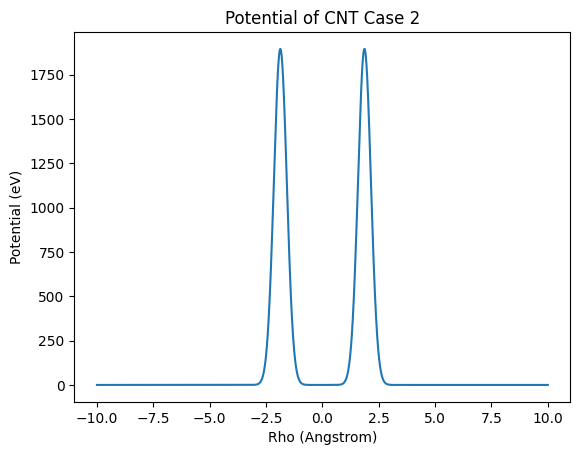

In [117]:
import matplotlib.pyplot as plt
# Generate the y array
y_arr = np.linspace(-10,10,2000)
v_arr = np.array([v2(y) for y in y_arr])
plt.plot(y_arr, v_arr)
plt.xlabel('Rho (Angstrom)')
plt.ylabel('Potential (eV)')
plt.title('Potential of CNT Case 2')
plt.show()

# Motivation

## Converting MATLAB .dat file into pandas dataframe

In [118]:
import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd

# Read the data from the file

df = pd.read_csv("CNT_dat.csv")
# Output dataframe
cnt_csv = pd.DataFrame(columns = ['No.', 'X', 'Y', 'Z'])
val = df['No.']
for i in range(len(val)):
    temp = val[i].split(' ')
    temp = [x for x in temp if x]
    cnt_csv.loc[i] = [int(temp[0]), float(temp[2]), float(temp[3]), float(temp[4])]
cnt_csv.sort_values(by = ['Z'], inplace = True)
cnt_csv

,No.,X,Y,Z
0,1.0,1.957218,0.000000,0.00
34,35.0,-1.583422,1.150424,0.00
52,53.0,0.604813,-1.861425,0.00
45,46.0,-1.583422,-1.150424,0.00
19,20.0,0.604813,1.861425,0.00
...,...,...,...,...
83,84.0,0.604813,-1.861425,24.14
109,110.0,-1.583422,1.150424,24.14
98,99.0,-1.583422,-1.150424,24.14
116,117.0,0.604813,1.861425,24.14


In [119]:
# Export dataframe to csv
cnt_csv.to_csv("CNT_dat_new.csv", index = False)

## Ring array

In [120]:
dt = pd.read_csv("CNT_dat_new.csv")
dt

,No.,X,Y,Z
0,1.0,1.957218,0.000000,0.00
1,35.0,-1.583422,1.150424,0.00
2,53.0,0.604813,-1.861425,0.00
3,46.0,-1.583422,-1.150424,0.00
4,20.0,0.604813,1.861425,0.00
...,...,...,...,...
115,84.0,0.604813,-1.861425,24.14
116,110.0,-1.583422,1.150424,24.14
117,99.0,-1.583422,-1.150424,24.14
118,117.0,0.604813,1.861425,24.14


In [121]:
mid = (dt['Z'].max() + dt['Z'].min())/2
print("Center =", mid)
a = np.array(dt['Z'])
org = np.abs(a - mid).argmin()
o = a[org]
print("Closest ring to center =", o)
print("Index of the closest ring to center =", org)

Center = 12.07
Closest ring to center = 12.78
Index of the closest ring to center = 60


## Ring Investigation

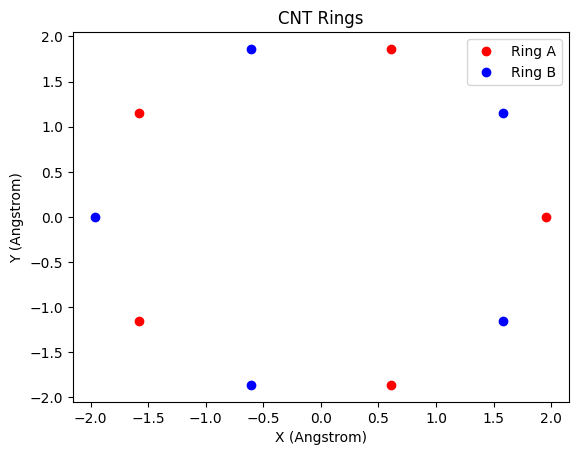

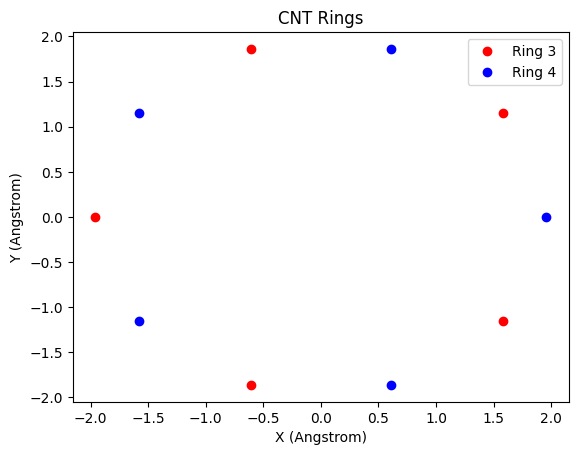

In [122]:
x0 = dt['X'][dt['Z'] == 0]
y0 = dt['Y'][dt['Z'] == 0]
x1 = dt['X'][dt['Z'] == 0.71]
y1 = dt['Y'][dt['Z'] == 0.71]
x2 = dt['X'][dt['Z'] == 2.13]
y2 = dt['Y'][dt['Z'] == 2.13]
x3 = dt['X'][dt['Z'] == 2.84]
y3 = dt['Y'][dt['Z'] == 2.84]
plt.plot(x0,y0, 'ro', label = 'Ring A')
plt.plot(x1,y1, 'bo', label = 'Ring B')
plt.xlabel('X (Angstrom)')
plt.ylabel('Y (Angstrom)')
plt.title('CNT Rings')
plt.legend()
plt.show()
plt.plot(x2,y2, 'ro', label = 'Ring 3')
plt.plot(x3,y3, 'bo', label = 'Ring 4')
plt.xlabel('X (Angstrom)')
plt.ylabel('Y (Angstrom)')
plt.title('CNT Rings')
plt.legend()
plt.show()

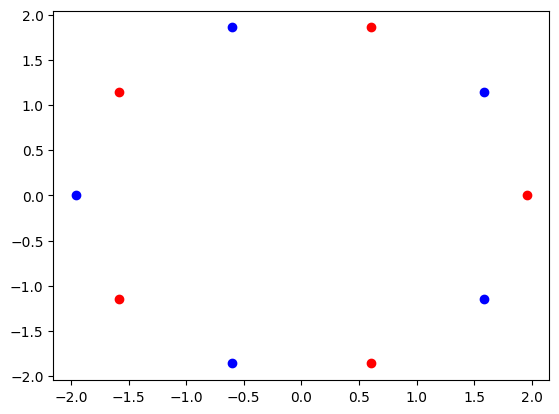

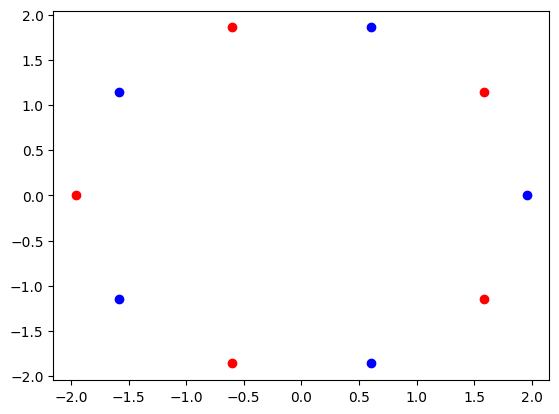

In [123]:
x4 = dt['X'][dt['Z'] == 4.26]
y4 = dt['Y'][dt['Z'] == 4.26]
x5 = dt['X'][dt['Z'] == 4.97]
y5 = dt['Y'][dt['Z'] == 4.97]
x6 = dt['X'][dt['Z'] == 6.39]
y6 = dt['Y'][dt['Z'] == 6.39]
x7 = dt['X'][dt['Z'] == 7.1]
y7 = dt['Y'][dt['Z'] == 7.1]
plt.plot(x4,y4, 'ro')
plt.plot(x5,y5, 'bo')
plt.show()
plt.plot(x6,y6, 'ro')
plt.plot(x7,y7, 'bo')
plt.show()

In [124]:
xa = np.array(dt['X'][dt['Z'] == 0])
ya = np.array(dt['Y'][dt['Z'] == 0])
xb = np.array(dt['X'][dt['Z'] == 0.71])
yb = np.array(dt['Y'][dt['Z'] == 0.71])
print(xa)
print(ya)
print(xb)
print(yb)

[ 1.957218 -1.583422  0.604813 -1.583422  0.604813]
[ 0.        1.150424 -1.861425 -1.150424  1.861425]
[ 1.583422 -0.604813  1.583422 -1.957218 -0.604813]
[-1.150424 -1.861425  1.150424  0.        1.861425]


## Case 2

Particle approaches from y axis

In [125]:
2.13-0.71

1.42

In [126]:
print("d/2 = ",1.42/2)

d/2 =  0.71


### Change in potential

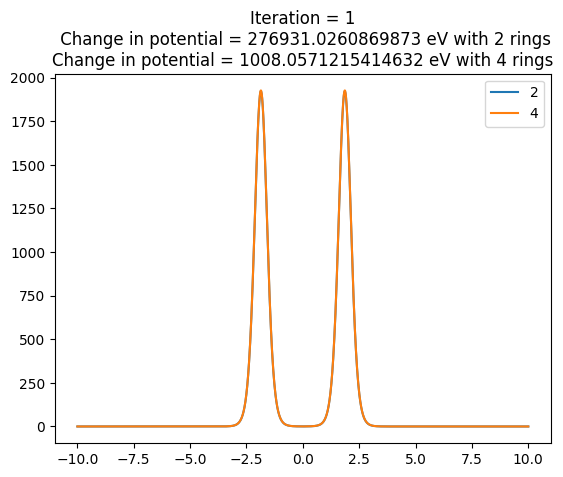

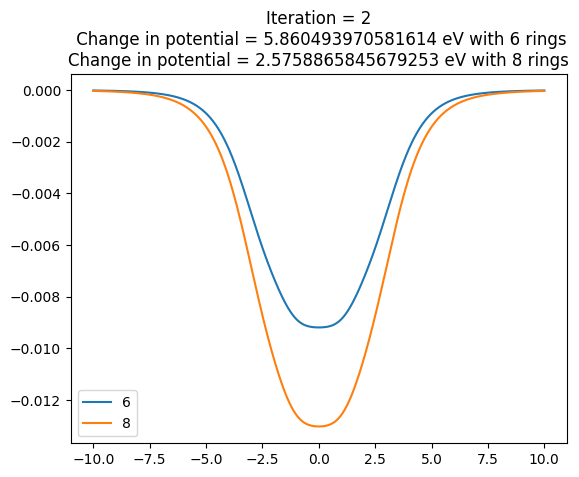

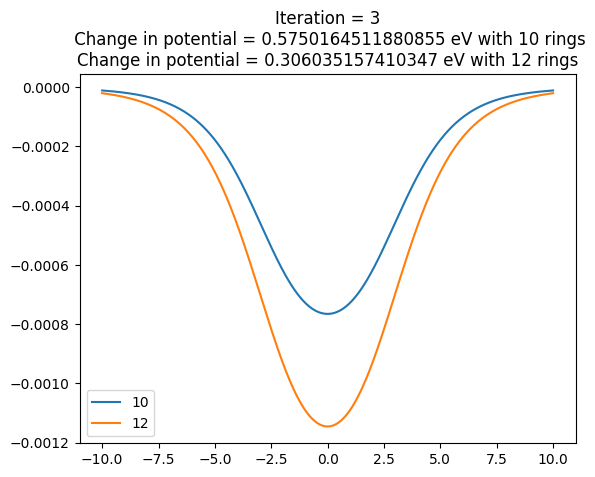

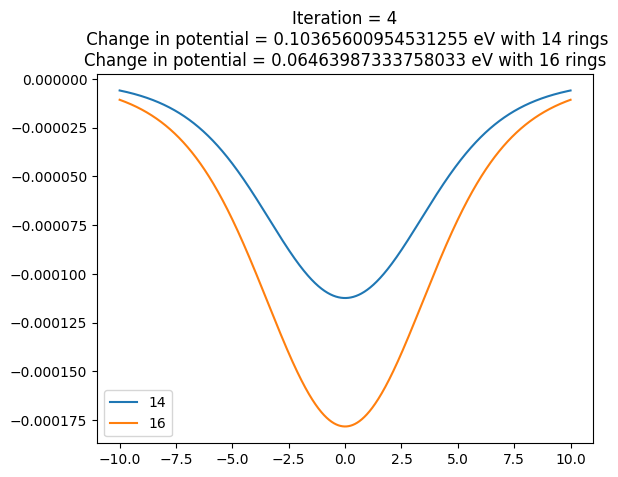

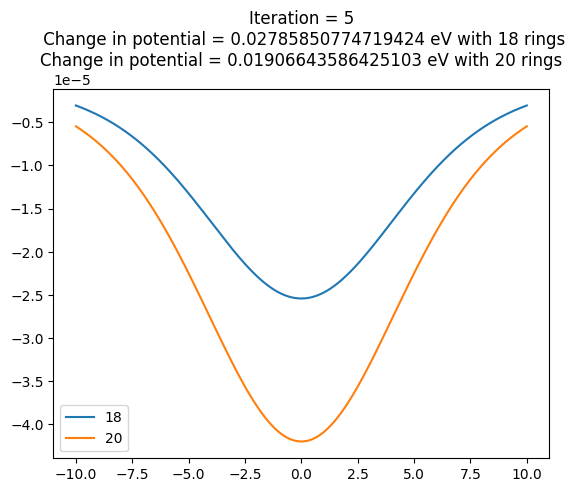

...

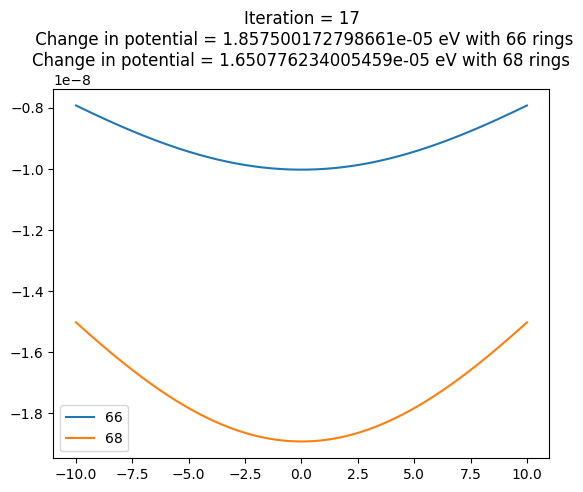

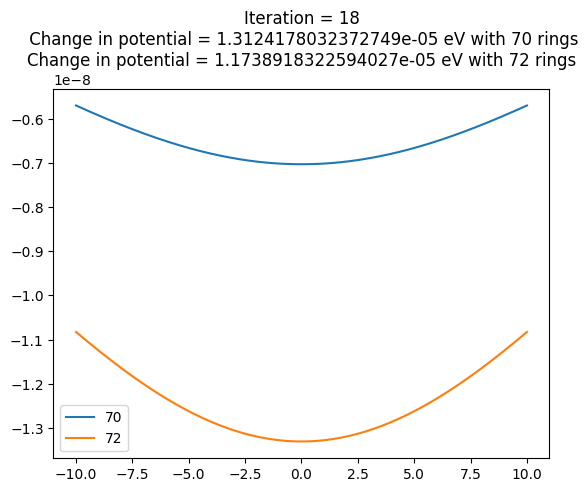

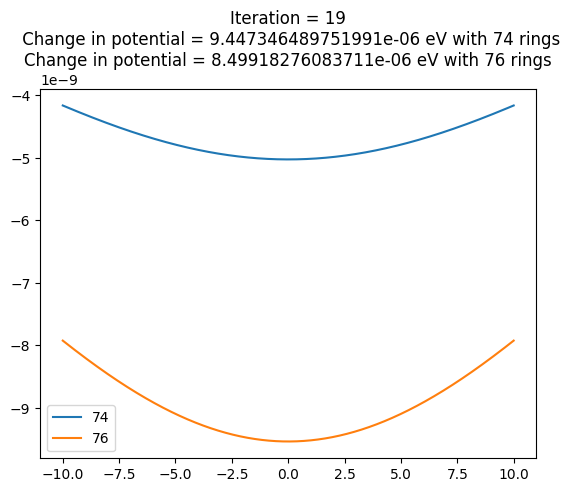

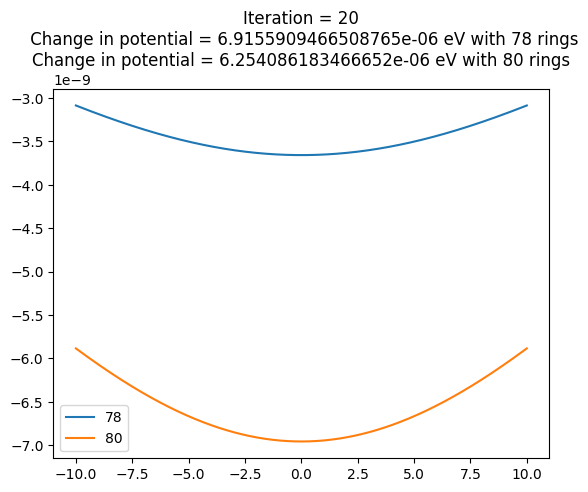

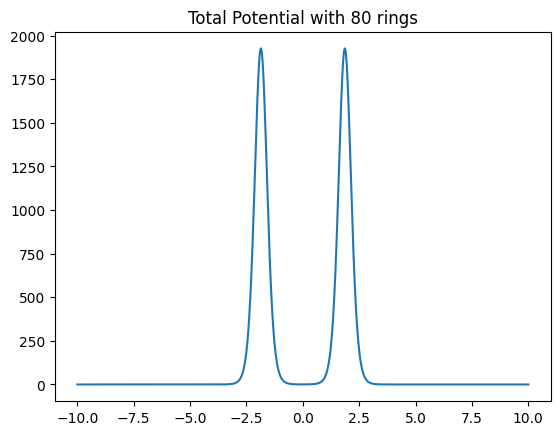

In [127]:
# Lennard-Jones potential
sigma = 2.4799 # Angstrom
epsilon = 0.00193 # eV
def lj(r): return (4*epsilon*(((sigma/r)**12) - ((sigma/r)**6)))

# Base ring
z0 = 0.71

# Two types of rings
xa = [1.957218, -1.583422,  0.604813, -1.583422,  0.604813]
ya = [0.000000,  1.150424, -1.861425, -1.150424,  1.861425]
xb = [1.583422, -0.604813,  1.583422, -1.957218, -0.604813]
yb = [-1.150424, -1.861425,  1.150424,  0.000000,  1.861425]

# Change in the potential upon addition of a ring
def dV(v0,v1):
    err = 0
    for i in range(len(y_arr)):
        err += abs(v0[i] - v1[i])
    return err
    
# Potential at a particular iteration--> +4 rings
def ring_pot(iter,r):
    x = 0
    y = r
    z = 0 
    # Decide the z values for the two rings
    if iter%2==0:
        za = z0 + 2.13*iter
        zb = z0 + 0.71 + 2.13*iter
    elif iter%2==1: 
        zb = z0 + 2.13*iter
        za = z0 + 0.71 + 2.13*iter
    # Calculate the potentials
    min_potential = 0
    net_potential = 0
    for i in range(len(xa)):
        Ra = ((x-xa[i])**2 + (y-ya[i])**2 + (z-za)**2)**0.5
        Rb = ((x-xb[i])**2 + (y-yb[i])**2 + (z-zb)**2)**0.5
        # Conditional updatation of the potentials
        if za>zb: min_potential += 2*lj(Rb)
        elif zb>za: min_potential += 2*lj(Ra)

        net_potential += 2*(lj(Ra) + lj(Rb))
        
    return net_potential, min_potential

# Potential over iterations
iterations = 0 
n_rings = 0
n_rings_arr = []
# Generate the y array
y_arr = np.linspace(-10,10,2000)
# Total potential array
potential = [0]*len(y_arr)

# Add rings iteratively
while iterations < 20:
    # Min_pot == Closest ring; 
    # Net_pot == Closest 2 rings; 
    # Total_pot == All rings uptil the current iteration
    net_pot_arr = []
    min_pot_arr = []
    total_pot = []
    for i in range(len(y_arr)):
        net_pot, min_pot = ring_pot(iterations,y_arr[i])
        min_pot_arr.append(min_pot)
        net_pot_arr.append(net_pot)
        potential[i] = net_pot+potential[i]

    # # Add the potentil to the previous iteration's potential
    # min_pot_arr = np.add(min_pot_arr, potential)
    # net_pot_arr = np.add(net_pot_arr, potential)
    
    # Plot +2 closest rings
    plt.plot(y_arr, min_pot_arr)
    n_rings += 2
    n_rings_arr.append(n_rings)
    str1 = f"Iteration = {iterations+1}\n Change in potential = {dV(min_pot_arr,[0]*len(y_arr))} eV with {n_rings} rings\n"
        
    # Plot +4 rings
    plt.plot(y_arr, net_pot_arr)
    n_rings += 2
    n_rings_arr.append(n_rings)
    str2 = f"Change in potential = {dV(net_pot_arr, min_pot_arr)} eV with {n_rings} rings"
        
    iterations += 1
    plt.title(str1+str2)
    plt.legend(n_rings_arr[-2:])
    plt.show()

plt.plot(y_arr, potential)
plt.title(f"Total Potential with {n_rings} rings")
plt.show()

### Total Potential

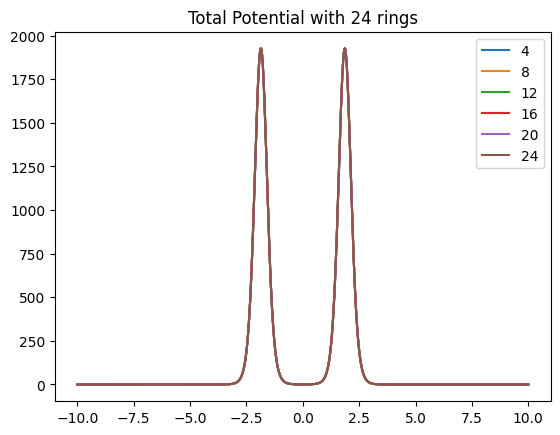

In [128]:
# Lennard-Jones potential
sigma = 2.4799 # Angstrom
epsilon = 0.00193 # eV
def lj(r): return (4*epsilon*(((sigma/r)**12) - ((sigma/r)**6)))

# Base ring
z0 = 0.71

# Two types of rings
xa = [1.957218, -1.583422,  0.604813, -1.583422,  0.604813]
ya = [0.000000,  1.150424, -1.861425, -1.150424,  1.861425]
xb = [1.583422, -0.604813,  1.583422, -1.957218, -0.604813]
yb = [-1.150424, -1.861425,  1.150424,  0.000000,  1.861425]

# Change in the potential upon addition of a ring
def dV(v0,v1):
    err = 0
    for i in range(len(y_arr)):
        err += abs(v0[i] - v1[i])
    return err
    
# Potential at a particular iteration--> +4 rings
def ring_pot(iter,r):
    x = 0
    y = r
    z = 0 
    # Decide the z values for the two rings
    if iter%2==0:
        za = z0 + 2.13*iter
        zb = z0 + 0.71 + 2.13*iter
    elif iter%2==1: 
        zb = z0 + 2.13*iter
        za = z0 + 0.71 + 2.13*iter
    # Calculate the potentials
    min_potential = 0
    net_potential = 0
    for i in range(len(xa)):
        Ra = ((x-xa[i])**2 + (y-ya[i])**2 + (z-za)**2)**0.5
        Rb = ((x-xb[i])**2 + (y-yb[i])**2 + (z-zb)**2)**0.5
        # Conditional updatation of the potentials
        if za>zb: min_potential += 2*lj(Rb)
        elif zb>za: min_potential += 2*lj(Ra)

        net_potential += 2*(lj(Ra) + lj(Rb))
        
    return net_potential, min_potential

# Potential over iterations
iterations = 0 
n_rings = 0
n_rings_arr = []
# Generate the y array
y_arr = np.linspace(-10,10,2000)
# Total potential array
potential = [0]*len(y_arr)

# Add rings iteratively
while iterations < 6:
    # Min_pot == Closest ring; 
    # Net_pot == Closest 2 rings; 
    # Total_pot == All rings uptil the current iteration
    net_pot_arr = []
    min_pot_arr = []
    total_pot = []
    for i in range(len(y_arr)):
        net_pot, min_pot = ring_pot(iterations,y_arr[i])
        min_pot_arr.append(min_pot)
        net_pot_arr.append(net_pot)
        potential[i] = net_pot+potential[i]

    
    # Plot +4 rings
    n_rings += 4
    n_rings_arr.append(n_rings)
    str2 = f"Change in potential = {dV(net_pot_arr, min_pot_arr)} eV with {n_rings} rings"
        
    iterations += 1
    plt.plot(y_arr, potential)
plt.legend(n_rings_arr)
plt.title(f"Total Potential with {n_rings} rings")
plt.show()